# Project: **Finding Lane Lines on the Road** 
***
In this project, we will use the opencv and python tools to identify lane lines on the road from pictures and tested videos.  

The following tools are used:
- opencv
- python

Traditional methodology of computer version compared with deep learning will be applyed in this project.Those following techniques are used:

- Color segmentation through RGB,HSV,HSL
- noise reduction by Morphology Operation
- Canny Edge Detection
- Region of Interest(ROI) Selection
- Hough Transform Line Detection
- Weighted Line fitting
---
## Project Target
When we drive, we use our eyes to decide where to go. The lines on the road that show us where the lanes are act as our constant reference for where to steer the vehicle. Naturally, one of the first things we would like to do in developing a self-driving car is to automatically detect lane lines using an algorithm.

In this project,lane lines will be marked in form of red lines as shown in Figure1.

<img src="examples/laneLines_thirdPass_raw.jpg" width="480" alt="Combined Image" align="left"/>
    
<img src="examples/laneLines_thirdPass.jpg" width="480" alt="Combined Image" align="right"/>

<div align = center>Figure 1.raw pictures(left);lane lines marked(right)</div>

<div align = center>
<img src="source/algorithmroutine.png"  alt="Combined Image" />
</div>
<div align = center>Figure 2.Algorithm routine</div>


## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import glob
import math
%matplotlib inline

## Test Images

**Show all lists under the corresponding directiory "test_images"**

In [2]:
os.listdir("test_images/")

['challenge1.jpg',
 'whiteCarLaneSwitch.jpg',
 'solidWhiteCurve.jpg',
 'challenge2.jpg',
 'solidWhiteRight.jpg',
 'challenge4.jpg',
 'challenge3.jpg',
 'challenge.jpg',
 'solidYellowCurve2.jpg',
 'solidYellowLeft1.jpg',
 'solidYellowCurve.jpg',
 'solidYellowLeft.jpg']

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


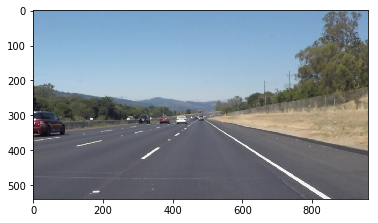

In [3]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
# if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')
plt.imshow(image)  

## Show all images for testing
Typical pictures within three testing videos has been snapshoted.Challenge.mp4 video may be very diffult for us to identify color regions,more tricky pictures which belong to it have been included.

In [4]:
def show_images(images, cmap=None):
    cols = 3
    rows = (len(images)+2)//cols 
    
    plt.figure(figsize=(40, 30))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

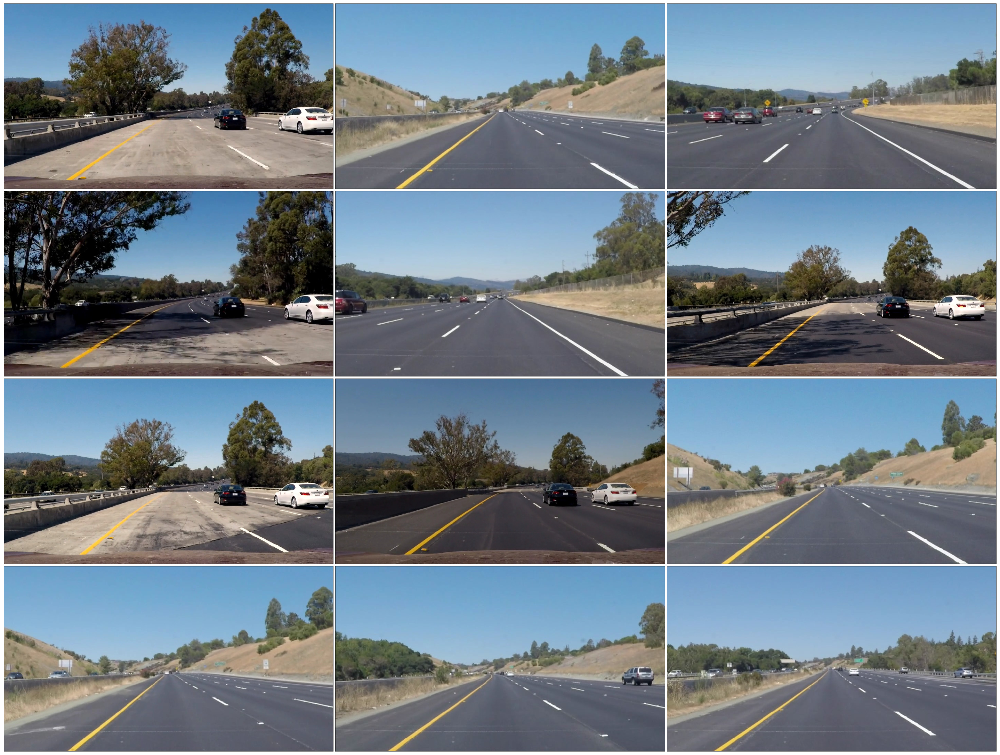

In [5]:
test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]

show_images(test_images)


## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

opencv documentation link:
https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_tutorials.html

## Color Selection through RGB,HSV,HSL

In [6]:
def colorselect(img):
    #color select through RGB
    # white color mask
    lower_white = np.array([200, 200, 200]) 
    upper_white = np.array([255, 255, 255]) 
    white_mask = cv2.inRange(img, lower_white, upper_white)
    # yellow color mask
    lower_yellow = np.array([225, 180, 0]) 
    upper_yellow = np.array([255, 200, 170]) 
    yellow_mask = cv2.inRange(img, lower_yellow, upper_yellow)
    # combine the mask
    mask1 = cv2.bitwise_or(white_mask, yellow_mask)
       
    #color select through HSV
    converted = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # white color mask
    lower_white = np.uint8([0, 0, 190])
    upper_white = np.uint8([255, 18, 255])
    white_mask = cv2.inRange(converted, lower_white, upper_white)
    # yellow color mask
    lower_yellow = np.uint8([ 20, 80, 80])
    upper_yellow = np.uint8([ 25, 255, 255])
    yellow_mask = cv2.inRange(converted, lower_yellow, upper_yellow)
    # combine the mask
#     mask2 = cv2.bitwise_or(white_mask, yellow_mask) 
    mask2 = yellow_mask
    
    #color select through HLS
    converted = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
#     # white color mask
#     lower_white = np.uint8([  0, 205,   0])
    lower_white = np.uint8([  0, 205,   0])
    upper_white = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted, lower_white, upper_white)
    # yellow color mask
    lower_yellow = np.uint8([ 10,   0, 100])
    upper_yellow = np.uint8([ 40, 255, 255])
    yellow_mask = cv2.inRange(converted, lower_yellow, upper_yellow)
    # combine the mask
    mask3 = cv2.bitwise_or(white_mask, yellow_mask)
    
    mask = cv2.bitwise_or(mask1, mask2)
    mask = cv2.bitwise_or(mask, mask3)
    
    return cv2.bitwise_and(img, img, mask = mask)

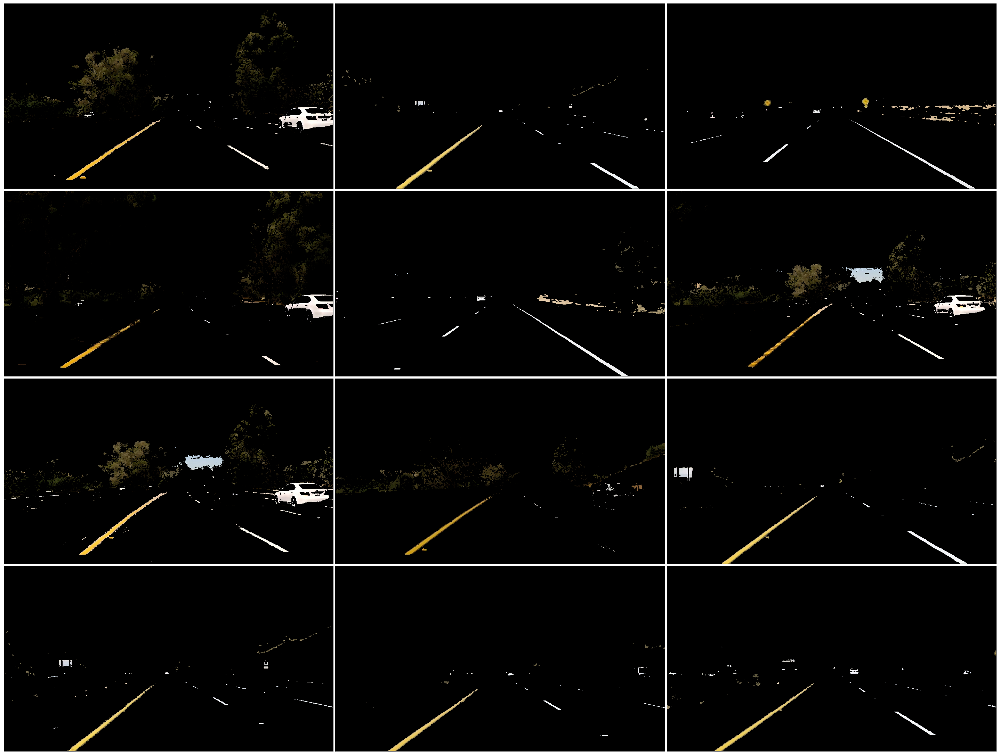

In [7]:
white_yellow_images = list(map(colorselect, test_images))

show_images(white_yellow_images)

## Morphology Operation

In [69]:
def noisereduce(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(8, 10))  
    
    closed = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)  
    
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2, 2))  
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)  
     
    return opened

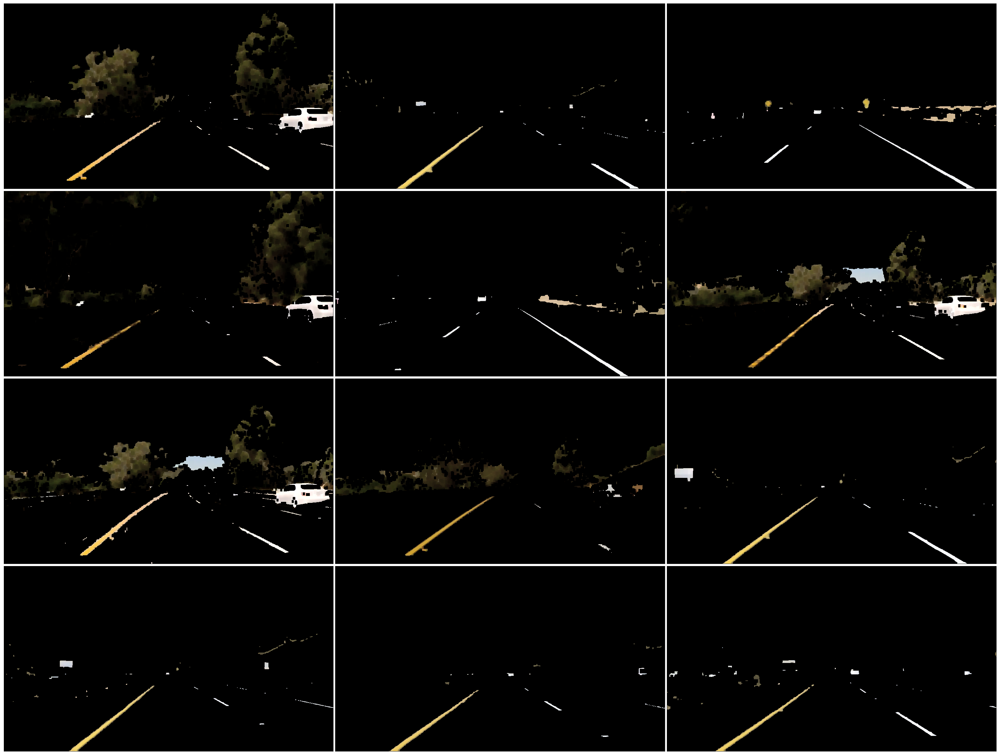

In [70]:
noisereduce_images = list(map(noisereduce, white_yellow_images))

show_images(noisereduce_images)

## Canny edge extract

In [10]:
def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    #return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def gaussian_blur(img, kernel_size=7):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def canny(img, low_threshold=50, high_threshold=150):
    gray = grayscale(img)
    blur = gaussian_blur(gray)
    """Applies the Canny transform"""
    return cv2.Canny(blur, low_threshold, high_threshold)

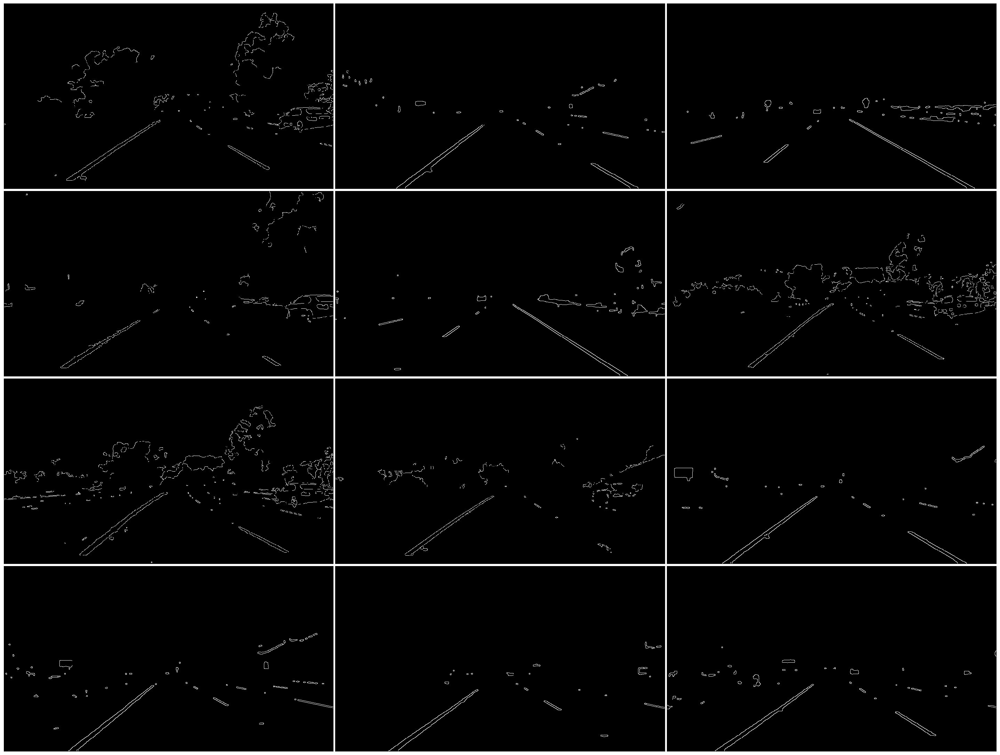

In [11]:
canny_images = list(map(canny, noisereduce_images))

show_images(canny_images)

## Region of interest detection

In [12]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def region_of_select(img):
    imshape = img.shape
    
    leftlowerscope = 0.4
    rightlowerscope = 0.6
    
    lefttupperscope = 0.1
    rightupperscope = 0.9
    
    
    ylowerscope = 0.60
    yupperscope = 0.95
    
    xverticeslowerleft = int(leftlowerscope*imshape[1])
    xverticeslowerright = int(rightlowerscope*imshape[1])
    xverticesupperleft = int(lefttupperscope*imshape[1])
    xverticesupperight = int(rightupperscope*imshape[1])
    
    yverticeslower = int(ylowerscope*imshape[0])
    yverticesupper = int(yupperscope*imshape[0])
    
    vertices = np.array([[(xverticeslowerleft,yverticeslower),(xverticeslowerright,yverticeslower),\
                          (xverticesupperight,yverticesupper),(xverticesupperleft,yverticesupper),\
                          ]], dtype=np.int32)
    
    return region_of_interest(img,vertices)

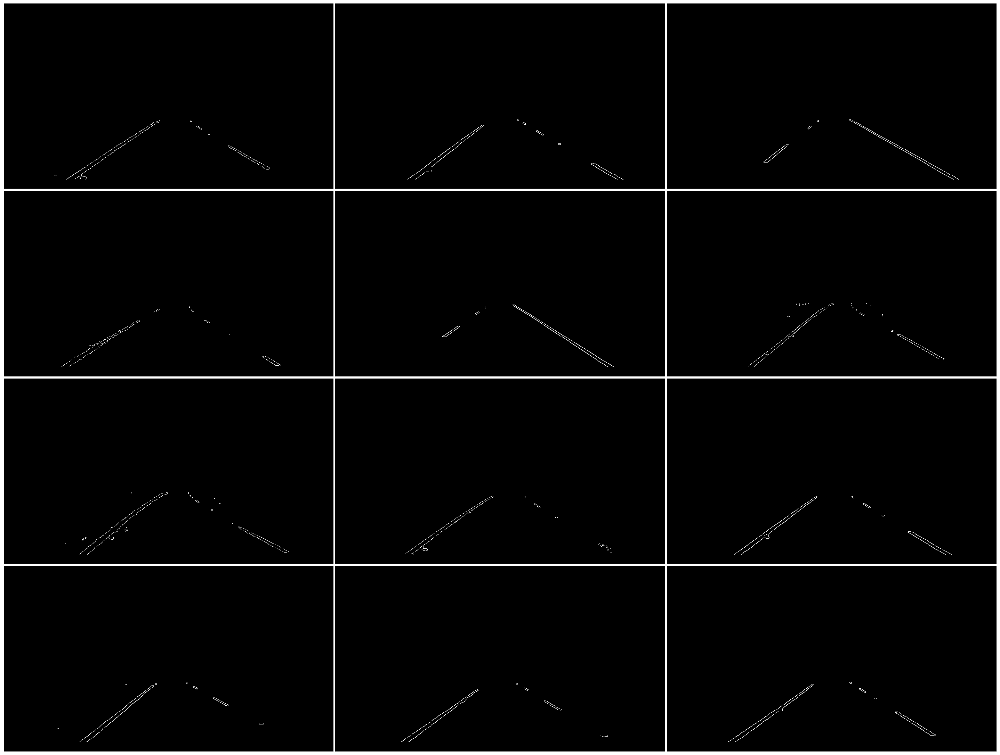

In [13]:
#region_images = list(map(region_of_select, test_images))
region_images = list(map(region_of_select, canny_images))

show_images(region_images)

## Lane Line drawing

In [14]:
def draw_lines(img, lines, color=[255, 0, 0], thickness=9):
    """
    Consider slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
#     #To  test and show orignal lines,resvered for debuging
#     for line in lines:
#         for x1,y1,x2,y2 in line:
#             if x2-x1 != 0:
#                 scope = (y2-y1)/(x2-x1)
#                 #if scope > 0.1 or scope < -0.1:
#                 cv2.line(img, (x1, y1), (x2, y2), color, thickness)
#     return None

    #left lane line slope
    leftslope=[]
    #left line length
    leftlen=[]
    #left line fit stored
    leftline=[]
    
    #right lane line slope
    rightslope=[]
    #right line length
    rightlen=[]
    #right line fit stored
    rightline=[]

    #line max y drawing region area limitation
    lineyminlimit = int(img.shape[0]*0.65)
    lineymaxlimit = img.shape[0]
                
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = np.polyfit((x1,x2),(y1,y2), 1)
            #scope[0]<--->slope
            #scope[0]<--->intercept
            #y=slope*x+intercept
            if slope[0] < -0.1:
                leftslope.append(slope)
                leftlen.append(np.sqrt((x1-x2)**2+(y1-y2)**2))
            elif slope[0] > 0.1:
                rightslope.append(slope)
                rightlen.append(np.sqrt((x1-x2)**2+(y1-y2)**2))
    
    def PositionCal(slope,y):
        if slope[0]!= 0:
            x = int((y-slope[1])/slope[0])
            return (x,y)
        else:
            return(0,0)
    
    #left line drawing
    if len(leftslope) > 0: 
        #weight slope through line length
        letlline = np.dot(leftlen,leftslope)/np.sum(leftlen)
        
        cv2.line(img, PositionCal(letlline,lineyminlimit), PositionCal(letlline,lineymaxlimit), color, thickness)
    
    #right line drawing
    if len(rightslope) > 0: 
         #weight slope through line length
        rightline = np.dot(rightlen,rightslope)/np.sum(rightlen)
        
        cv2.line(img, PositionCal(rightline,lineyminlimit), PositionCal(rightline,lineymaxlimit), color, thickness)

def hough_lines(img, rho=1, theta=np.pi/180, threshold=20, min_line_len=20, max_line_gap=120):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

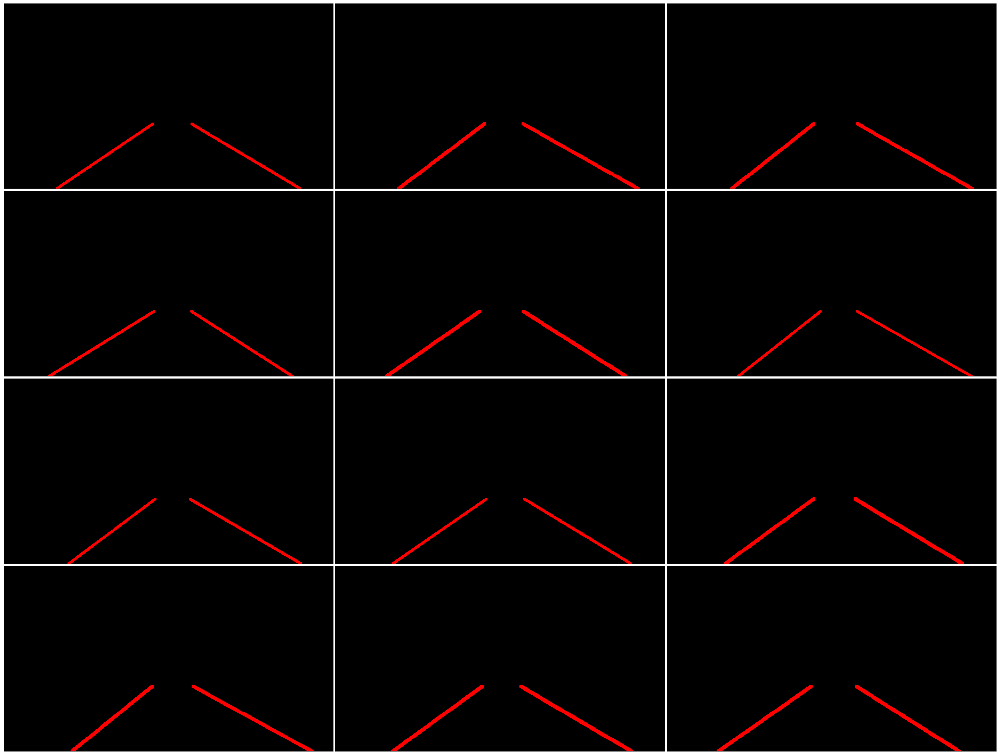

In [15]:
lane_images = list(map(hough_lines, region_images))

show_images(lane_images)


## Lane Line drawed into raw image

In [16]:
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

def laneline_detection(img):
    # creating a blank to draw lines on
    line_image = np.copy(img)*0 
    
    white_yellow_images = colorselect(img)
    
    noisereduce_images = noisereduce(white_yellow_images)
    
    canny_images = canny(noisereduce_images)
    
    region_images = region_of_select(canny_images)
    
    lane_images = hough_lines(region_images)
    
    # Draw the lines on the image
    lines_edges =  weighted_img(lane_images, img)
    
    return lines_edges

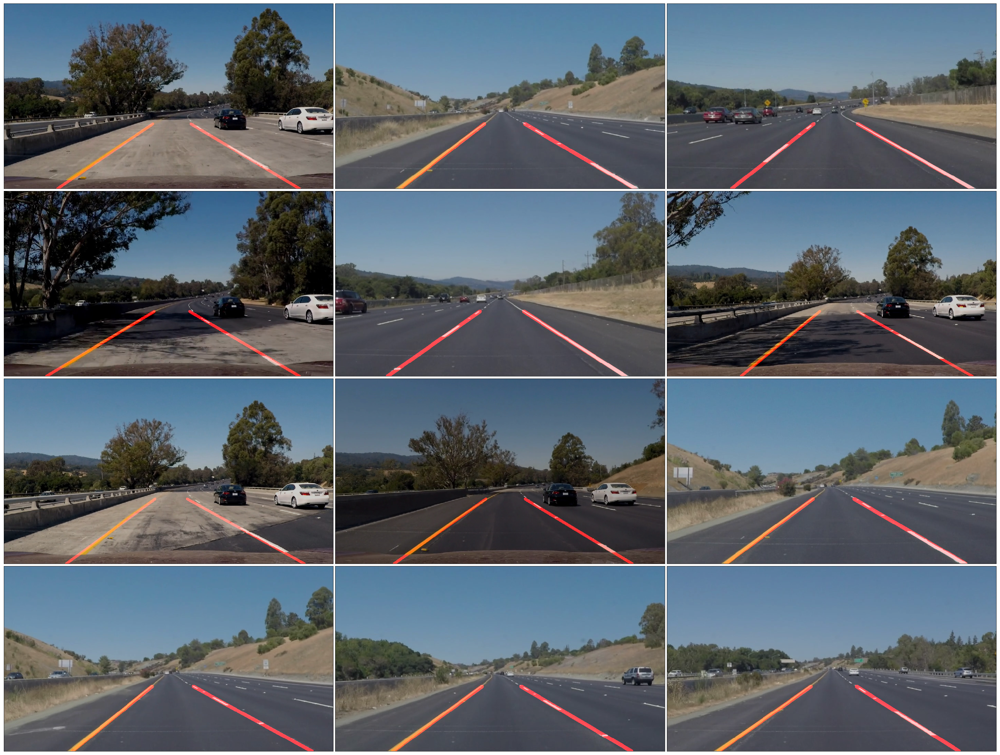

In [45]:
lanedraw_images = list(map(laneline_detection, test_images))

show_images(lanedraw_images)

## Lane Line detection on specied images
Build the pipeline and run solution any possible test_images. 

Create `test_images_output` directory in project root, and images can be saved in this directory for future use.

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


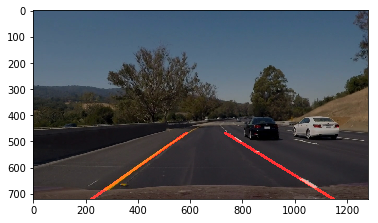

In [18]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images_output directory.
#reading in an image
#image = mpimg.imread('test_images/solidWhiteRight.jpg')
#image = mpimg.imread('test_images/solidYellowCurve.jpg')
image = plt.imread('test_images/challenge.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)

result = laneline_detection(image)
  
plt.imshow(result)

plt.imsave('test_images_output/challengetest.jpg',result,format="jpg")

## Test on Videos

finally,We can test our solution on three provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

`challenge.mp4`

In [19]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [73]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    
    return laneline_detection(image)

### solidWhiteRight

In [74]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4


100%|█████████▉| 221/222 [00:10<00:00, 25.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

CPU times: user 13.8 s, sys: 1.5 s, total: 15.3 s
Wall time: 10.8 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [75]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

### solidYellowLeft

In [76]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidYellowLeft.mp4
[MoviePy] Writing video test_videos_output/solidYellowLeft.mp4


100%|█████████▉| 681/682 [00:31<00:00, 21.54it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidYellowLeft.mp4 

CPU times: user 45.7 s, sys: 3.47 s, total: 49.1 s
Wall time: 32.6 s


In [1]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

NameError: name 'HTML' is not defined

### challenge

In [78]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge.mp4
[MoviePy] Writing video test_videos_output/challenge.mp4


100%|██████████| 251/251 [00:24<00:00, 10.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge.mp4 

CPU times: user 26.6 s, sys: 2.68 s, total: 29.2 s
Wall time: 26.5 s


In [79]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))